In [3]:
from IPython.display import display, HTML, clear_output
import ipywidgets as widgets
HTML('''<script src="https://cdnjs.cloudflare.com/ajax/libs/jquery/2.0.3/jquery.min.js "></script><script>
code_show=true;
function code_toggle() {
if (code_show){
$('div.jp-CodeCell > div.jp-Cell-inputWrapper').hide();
} else {
$('div.jp-CodeCell > div.jp-Cell-inputWrapper').show();
}
code_show = !code_show
}
$( document ).ready(code_toggle);</script><form action="javascript:code_toggle()"><input type="submit" value="Click here to toggle on/off the raw code."></form>
''')

In [ ]:
pip install spotipy

In [ ]:
import numpy as np
import pandas as pd

import spotipy
from spotipy.oauth2 import SpotifyClientCredentials
from getpass import getpass

from mlxtend.frequent_patterns import apriori
from mlxtend.frequent_patterns import fpgrowth, association_rules

import keyring
import time

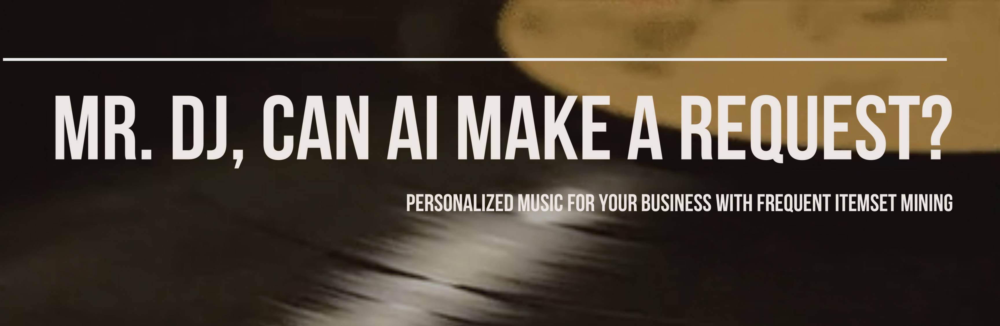

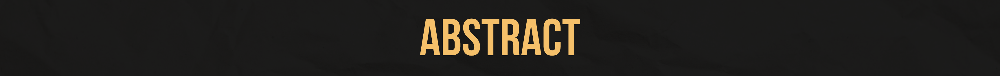
The current recommendation system Spotify uses for playlist creation seems to focus on the user’s preferences and listening history. This prevents the user from discovering songs that are relevant to the desired context. It also encapsulates the user into a listening bubble, providing the same recommendations on what the user already likes and has listened to. Providing a novel approach compared to user-centric music recommendation systems, this algorithm prioritizes business goals by considering the desired ambiance and target audience. This study proposes a business-oriented playlist creation algorithm that leverages context-based filtering and Frequent Itemset Mining (FIM) techniques. The proposed system utilizes the Spotify Web API to gather music data and analyzes playlists associated with cafes. The implemented model generates song recommendations that align with the audio features of user-provided inputs while also introducing users to new music selections.

By assessing the algorithm through qualitative (A/B Testing) and quantitative (Distance Metrics) techniques, the findings demonstrated the algorithm's effectiveness in generating results that are more relevant and novel than Spotify’s existing recommendations for playlist creation.

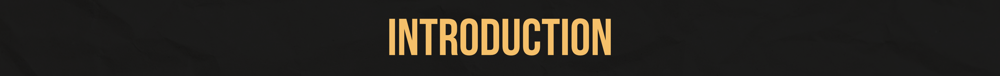
Businesses that cultivate a positive ambiance understand its power to attract and retain customers. A well-crafted atmosphere can transform a simple transaction into a memorable experience. One can imagine a cozy bookstore with soft music, comfortable armchairs, and scent of their books, providing a welcoming aura for bookworms. Another case may be a coffee shop–by leveraging warm lights and wooden furniture, it may invite customers to stay and make it their space to work. Beyond the products or services they offer, successful businesses understand the power of creating a welcoming ambiance. This atmosphere can be the deciding factor between a quick transaction and a lingering customer. Music plays a significant role in crafting this experience. The right tunes can set the mood, influence customer behavior, and even impact how much they spend. Upbeat music can energize a space, encouraging people to move through a store quickly. Conversely, calmer melodies can create a relaxing atmosphere, perfect for lingering over a coffee or browsing products. By carefully curating their music selection, businesses can subtly nudge customers towards a desired state of mind, ultimately enhancing their overall experience.

For this context, the research would like to focus on Spotify, and this study recognizes Spotify’s abilities and inabilities. Spotify leverages a multitude of recommendation systems (RecSys) throughout its interface, including album and playlist recommendations. Notably, one such system appears when creating a new playlist. Inputting one to three songs, Spotify suggests additional tracks for inclusion. However, these suggestions often lean heavily towards user-centric recommendations, focusing on songs the individual has already liked or listened to.

This user-centric approach, while valuable for personal listening experiences, falls short for businesses with specific goals in mind. Businesses require music that aligns with their brand image and subtly influences customer behavior to achieve desired outcomes.

This is where our proposed solution comes in. We aim to create an algorithm specifically designed for business owners seeking curated playlists. Unlike Spotify's user-centric RecSys, our system would consider two key factors:

1. **Business Focus:** The algorithm would take into account the specific nature of the business, its brand identity, and the desired customer experience.
2. **Curated Vibes:** By analyzing the three initial songs provided by the business owner, the algorithm would identify the intended vibe (e.g., energetic, relaxing) and suggest additional tracks that complement both the business focus and the desired atmosphere.

By considering these elements, our business-oriented algorithm would empower business owners to create playlists that not only reflect their brand image but also subtly influence customer behavior to achieve specific goals.

## Problem Statement
Current music streaming platforms like Spotify are designed for personal music preference, offering customer-centric playlists based on individual taste. This approach falls short for businesses seeking to curate music specifically for their ambiance. Therefore, there is a need for a business-centric music curation tool that goes beyond personal preferences and strategically utilizes music to cultivate a desired atmosphere, and influence customer behavior.

## Objectives
The aim of this study is to simulate a business owner’s input and create an algorithm utilizing (1) Frequent Itemset Methods such as Apriori, ECLAT, and FP-Growth, and (2) Spotify API to provide a playlist curated for the respective ambiance fit for the business owner’s type of business. More specifically, the study aims to:
1. **Develop a Context-Based Algorithm:** This algorithm will filter playlists based on the type of business involved. It will analyze business categories and associated music genres to ensure suggested playlists align with the brand identity and target audience.
2. **Implement Frequent Itemset Mining:** By analyzing user listening patterns within specific business categories, the algorithm will identify frequently co-occurring songs. This technique will uncover songs that not only complement each other musically but also resonate with customers typically frequenting that type of business.
3. **Generate Personalized Recommendations:**  Leveraging the context-based filtering and frequent itemset mining, the algorithm will recommend songs that align with the mood that business owners desire for their shop.

By achieving these objectives, our proposed solution will empower businesses to curate playlists that enhance their brand image, create a desired customer experience, and potentially influence customer behavior.

For the simulation that will be delved further in the Methodology section, the focus is on a cafè business that wishes to be associated with acoustic and melancholic tunes.

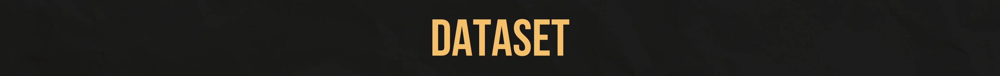
The dataset was obtained by web-scraping from Spotify with keywords associated to the type of business in question–cafè. Below are the features integral to the creation of the model, along with the description.

| Feature Name          | Description |
|-----------------------|-------------|
| `song_id`            | A unique identifier for each individual song in the dataset. |
| `song_name`          | The title of the song. |
| `artist_id`          | A unique identifier for the artist who performs the song. This is to ensure there are no duplicates of the song. |
| `audio_features`     | Characteristics of the song's audio, such as tempo, key, danceability, energy, and more, which can be used to analyze and categorize the song. |
| `playlist_id`        | A unique identifier for each playlist included in the dataset. |
| `playlist_name`      | The name of the playlist, which can give insights into the theme or mood the playlist intends to convey. |
| `playlist_owner`     | The playlist creator, which can help identify potential biases or styles in the playlist curation. |
| `playlist_description` | A text field providing context about the playlist's theme or intended ambiance, crucial for understanding the purpose behind the song selection. |
<center><strong><em>Table 1.</em></strong> Features of the Dataset Used and Their Descriptions</center>

For the dataset, the transaction is the playlist and the items returned are the songs. Playlist attributes are `’playlist_id’`, `’playlist_name’`, `’playlist_owner’`, and `’playlist_description’`. Song attributes are `’song_id’`, `’song_name’`, `’artist_id’`, and `’audio_features’`.

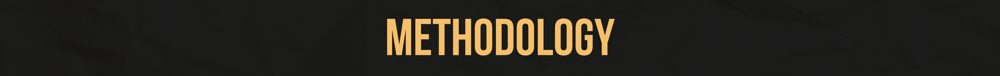
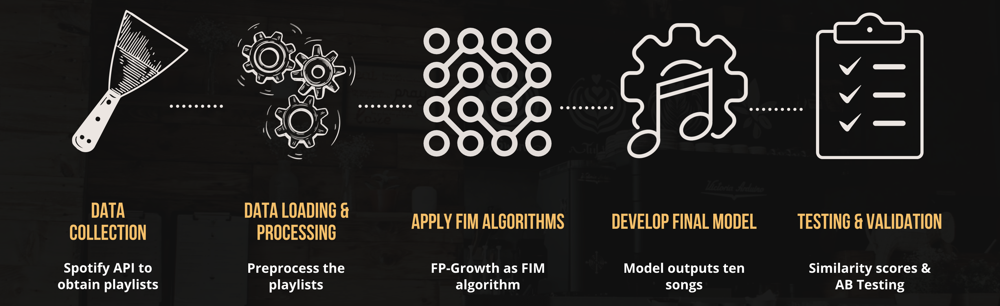
This study's methodology aims to provide a pipeline that could, with near-unlimited resources, function with a wide range of inputs for business types. While the example used here is a cafe, the methodology is applicable to any business type, provided there's an automated keyword generator tailored to specific business categories.

#### Data Collection (Web Scraping)
Utilizing the Spotify API through the spotipy python package and specific search keywords such as 'cafe,' 'coffee,' 'shop,' 'kape,' and 'pinoy' allowed us to curate playlists relevant to our research topic. These keywords are associated with the theme of cafes and coffee shops, which aligns with the intended focus of our study. By fetching playlists using these keywords, we aimed to gather a diverse range of music collections typically associated with such environments.

#### Data Cleaning and Processing (Filtering)
Cleaning the data by retaining only those entries where the keywords were present in either the `’playlist_name'` or `'playlist_description'` fields ensured relevance to our research topic. By focusing only on playlists that explicitly mention the keywords, we aimed to filter out irrelevant playlists and streamline the dataset for further analysis. Additionally, limiting each playlist owner to contributing only one playlist helped increase the diversity of the dataset, preventing potential biases that could arise from multiple contributions by the same owner.

Fetching all songs within each playlist using their respective playlist IDs allowed us to gather comprehensive song data for analysis. One-hot encoding of the songs facilitated their processing for Frequent Itemset Mining (FIM) by transforming them into a format suitable for algorithmic analysis.

#### Application of Frequent Itemset Mining (FIM) (Recommend Songs)
Utilizing the FP-Growth algorithm with specified minimum support and confidence thresholds enabled us to identify frequent itemsets within the dataset. Frequent Itemset Mining (FIM) algorithms uncover frequently occurring combinations of items in a transaction database. In our case, these 'items' could be music genres, tempos, or moods. Below is a brief overview of the three FIM algorithms considered:

| Algorithm    | Description |
|--------------|-------------|
| `Apriori`    | It works by iteratively finding sets of items that frequently appear together, gradually building larger sets from smaller ones. However, Apriori can be computationally expensive for large datasets. |
| `ECLAT` (Equivalence Class Transformation) | This algorithm improves upon Apriori by using a more efficient data structure and reducing candidate generation steps. However, it performed slower than FP-Growth for this dataset. |
| `FP-Growth` (Frequent Pattern growth) | This algorithm works by constructing a frequent pattern tree from the data, which allows for faster pattern identification compared to Apriori and ECLAT. |
<center><strong><em>Table 2.</em></strong> Three FIM algorithms explored</center>

#### Validation of Results:
##### *Quantitative Metrics*
Building a model that directly copies Spotify’s algorithm would defeat the purpose of the study. From this notion, the researchers conducted an assessment to validate the performance of the model with a random volunteer and distance metrics. The assessment methodology is as follows:
1. Input the same three songs both in the model and in the Spotify application of a volunteer tester. The volunteer makes a new playlist and adds the three songs as the input. The volunteer checks the first five (5) songs presented by Spotify, and refreshes once.
2. Compare the resulting 10 recommended songs of the model and the gathered result from the volunteer's Spotify app.
3. The following metrics are used to compute the distance between the input songs versus the model and volunteer’s Spotify application, based on the `’audio_features’` extracted.

| Distance Calculation    | Description |
|-------------------------|-------------|
| `Manhattan Distance (L1 Distance)` | It can be seen as a measure of difference where each factor from audio features contribute equally to the total distance. |
| `Euclidean Distance (L2 Distance)` | Being the most direct way to measure distance, it takes the straight-line distance between two points in space by taking the square root of the sum of the squared differences between each dimension. |
| `Cosine Distances`      | Measures how "alike" the songs are in terms of their feature vectors, regardless of their magnitude. |
| `Mahalanobis Distance`  | Determines whether the song is an outlier, whether a process is in control or whether a song is a member of a group or not. |
<center><strong><em>Table 3.</em></strong> Four Distance Calculations and Their Descriptions</center>

For Manhattan Distance and Euclidean Distance, the two directly calculate the total difference between features. A smaller distance means the songs' features are more aligned, suggesting they'd sound similar. For Mahalanobis Distance, a small value may suggest that a song belongs to a genre based on the dataset.


##### *Qualitative Metric*
Another metric used is a subjective response to whether the resulting recommendations from their Spotify account provided songs they are not familiar with. This is with the aim of making sure that the model developed provided songs that have similar characteristics while also providing serendipity to the user.


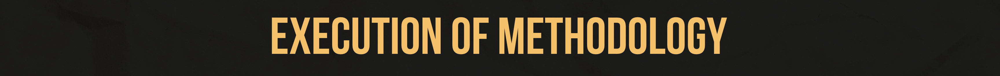

### Data Collection (Web Scraping)

In [ ]:
password = getpass()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


··········


In [ ]:
client_id = '9f10acd67be24a578d8c87f0721c683e'
client_secret = password

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
client_credentials_manager = SpotifyClientCredentials(client_id, client_secret)
sp = spotipy.Spotify(client_credentials_manager = client_credentials_manager)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
def print_dict_structure(d, indent=0):
    """
    Print the nested structure of a dictionary with
    keys indented to show hierarchy.
    """
    for key, value in d.items():
        print('  ' * indent  +  str(key))
        if isinstance(value, dict):
            print_dict_structure(value, indent + 2)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


### Data Loading

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

data_dir = '/content/drive/MyDrive/DMW Final Project/'

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
df_coffee_playlist_songs = pd.read_csv(data_dir+'df_coffee_playlist_songs')
df_coffee_playlist_songs

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,playlist_id,playlist_name,song_name,artist_name,song_id,artist_id
0,37i9dQZF1DXa1BeMIGX5Du,Coffee + Chill,Mudroom,Tiny Habits,6UJaQZTvpWUWp7FZDJJUXj,2QYdqWGgRorVkA8cJMMdrn
1,37i9dQZF1DXa1BeMIGX5Du,Coffee + Chill,All I Have,RY X,5v6Jj76nTkyTTvZ70NSUVJ,2KjAo6wVc9d2WcxdxSArpV
2,37i9dQZF1DXa1BeMIGX5Du,Coffee + Chill,Good Thing,Maple Glider,1avgH7udg2X4mx82V1ChDC,1Y3IqLN3JkfppIbJG2IWHk
3,37i9dQZF1DXa1BeMIGX5Du,Coffee + Chill,Blue Lake,Rod Coote,7CvKEtfHFgxKxzsfHpxsZc,5xifoiBHJPatPhtG96G1ck
4,37i9dQZF1DXa1BeMIGX5Du,Coffee + Chill,The Wedding Song,Angus & Julia Stone,2mwY1C4oCxPFy2A3UQIcEu,4tvKz56Tr39bkhcQUTO0Xr
...,...,...,...,...,...,...
29522,0BP6NWUDH0BAuH6OrqEfRv,MORNING VIBES ☕️,Slow Down (feat. Jorja Smith) - Vintage Cultur...,Maverick Sabre,5PNvgiKSwMdjBsDsgFCFLX,0ukgrNYk51TkMQr0f2Br4Q
29523,0BP6NWUDH0BAuH6OrqEfRv,MORNING VIBES ☕️,Marea (we’ve lost dancing),Fred again..,1t0Jmqg1pKVBbxjQFZebeR,4oLeXFyACqeem2VImYeBFe
29524,0BP6NWUDH0BAuH6OrqEfRv,MORNING VIBES ☕️,Whistle (feat. Calum Scott),Jax Jones,4q05KbxYZ5JdkmrletgPjF,4Q6nIcaBED8qUel8bBx6Cr
29525,0BP6NWUDH0BAuH6OrqEfRv,MORNING VIBES ☕️,Heaven Takes You Home (feat. Connie Constance),Swedish House Mafia,3nEHrvNNtgLv9rneTAYVr4,1h6Cn3P4NGzXbaXidqURXs


### Data Cleaning and Processing (Filtering)

In [ ]:
df_coffee_playlist_songs['song_name'] = (df_coffee_playlist_songs
                                         ['song_name'].str.strip())
df_coffee_playlist_songs['playlist_id'] = (df_coffee_playlist_songs
                                           ['playlist_id'].astype('str'))

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
basket = (df_coffee_playlist_songs
          .groupby(['playlist_id', 'song_name'])['song_name']
          .count().unstack().reset_index().fillna(0)
          .set_index('playlist_id'))


basket

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


song_name,"""1119""","""Slut!"" (Taylor's Version) (From The Vault)","""Was mir behagt, ist nur die muntre Jagd"" Cantata, BWV 208 - arr. Mary Howe for two pianos: 9. Schafe können sicher weiden",#1 Crew,#1 Fan (feat. Keyshia Cole & J. Holiday),#1 Stunna,#9 Dream - Remastered 2010,#FindYouAMirror,#TokyoGxng,$10,...,† (just the cross) - Live,エトピリカ,歌の翼に Op. 34-2(チェロ&ピアノ編),青い魚,ꞌCosmicꞌ.m4a,말하자면,"여름밤에 우리 summer, night (feat. wave to earth)",중독 Overdose,하루살이,회상 Reminiscence
playlist_id,,,,,,,,,,,,,,,,,,,,,
0BP6NWUDH0BAuH6OrqEfRv,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
0MmJin2lNE7CAUE8UAQSnM,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
0NbAUvVFISvYvzMaJD3qMn,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
0PzTB0SzhsYdmq3lvb0zgv,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
0VSytRfEzD7IgT3f8Yz9st,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7K6fVGUcL6ChCsRMJP4oOC,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7avKDwpw6IUom5eZC4fKtP,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
7l9yJkbaUZFwrzPWXCCMhe,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
def encode_units(x):
    """Return 1 if x is greater than 0, otherwise return 0."""
    if x <= 0:
        return 0
    if x >= 0:
        return 1

basket_sets = basket.applymap(encode_units)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


### Application of Frequent Itemset Mining (FIM) (Recommend Songs)

Since FP-Growth utilizes the most elimination rules when checking for frequent itemsets, it outperforms Apriori in terms of computational speed. For ECLAT, the fact that we have a significant amount of items makes it inefficient for this use case. This makes FP-Growth the ideal choice for our study, especially when dealing with potentially large music datasets. Therefore, FP-Growth's swift return of results was crucial for efficiently identifying frequent combinations of music characteristics that contribute to desired business ambiances.

The minimum support threshold was set at 0.014 to ensure we don’t miss out on any interesting patterns that occur less frequently. The initial minimum was set at 0.01, however, the available computational resources could not handle the algorithm anymore. The confidence threshold of 10% ensured that the association rules generated from the frequent itemsets were sufficiently reliable.

Prioritizing larger itemsets first, sorted by their confidence and lift values, allowed us to focus on the most significant patterns within the data. Larger itemsets typically represent more complex associations between songs, while confidence and lift provide insights into the strength and significance of these associations, respectively. Placing emphasis on confidence rather than lift enables the system to suggest songs that possess an element of popularity. It is not favorable for the system to endorse a song that has a significant association but lacks a listening audience.

#### *FIM over Recommendation Systems*
* The team chose FIM over recommendation systems for this use case because of the following advantages:
Frequent Itemset does not rely on any sort of song or playlist rating.
* It does not experience a cold start problem for the user, since it does not utilize the song rating of the user.
* FIM captures the association patterns from a wide collection of playlist, offering more in terms of diversity and serendipity.
* The relevance aspect is addressed by the context based filter on the business keywords.

In [ ]:
apriori_fim = apriori(basket_sets, min_support=0.05, use_colnames=True)
rules = association_rules(apriori_fim, metric='confidence', min_threshold=0.5)
rules

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
/usr/local/lib/python3.10/dist-packages/mlxtend/frequent_patterns/fpcommon.py:110: DeprecationWarning: DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type
  warnings.warn(


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
0,(7 Years),(Chasing Cars),0.07,0.10,0.05,0.714286,7.142857,0.0430,3.150000,0.924731
1,(Chasing Cars),(7 Years),0.10,0.07,0.05,0.500000,7.142857,0.0430,1.860000,0.955556
2,(7 Years),(Fast Car),0.07,0.18,0.06,0.857143,4.761905,0.0474,5.740000,0.849462
3,(7 Years),(I'm Yours),0.07,0.10,0.05,0.714286,7.142857,0.0430,3.150000,0.924731
4,(I'm Yours),(7 Years),0.10,0.07,0.05,0.500000,7.142857,0.0430,1.860000,0.955556
...,...,...,...,...,...,...,...,...,...,...
12038,"(Circles, Pumped Up Kicks)","(Fast Car, Beautiful Girls, Memories, Let Her ...",0.06,0.05,0.05,0.833333,16.666667,0.0470,5.700000,1.000000
12039,(Beautiful Girls),"(Fast Car, Memories, Let Her Go, Chasing Cars,...",0.08,0.05,0.05,0.625000,12.500000,0.0460,2.533333,1.000000
12040,(Chasing Cars),"(Fast Car, Beautiful Girls, Memories, Let Her ...",0.10,0.05,0.05,0.500000,10.000000,0.0450,1.900000,1.000000
12041,(Attention),"(Fast Car, Beautiful Girls, Memories, Let Her ...",0.06,0.05,0.05,0.833333,16.666667,0.0470,5.700000,1.000000


In [ ]:
fp_growth_fim = fpgrowth(basket_sets, min_support=0.05, use_colnames=True)
rules = association_rules(fp_growth_fim,
                          metric='confidence',
                          min_threshold=0.5)

rules

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
/usr/local/lib/python3.10/dist-packages/mlxtend/frequent_patterns/fpcommon.py:110: DeprecationWarning: DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type
  warnings.warn(


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
0,(Chemical),(Circles),0.11,0.15,0.07,0.636364,4.242424,0.0535,2.3375,0.858748
1,"(Circles, Chemical)",(As It Was),0.07,0.15,0.05,0.714286,4.761905,0.0395,2.9750,0.849462
2,"(Circles, As It Was)",(Chemical),0.09,0.11,0.05,0.555556,5.050505,0.0401,2.0025,0.881319
3,"(Chemical, As It Was)",(Circles),0.05,0.15,0.05,1.000000,6.666667,0.0425,inf,0.894737
4,"(Fast Car, Memories)",(Chemical),0.07,0.11,0.05,0.714286,6.493506,0.0423,3.1150,0.909677
...,...,...,...,...,...,...,...,...,...,...
12038,"(Say You Won't Let Go, Easy On Me)","(This Town, Someone You Loved, Be Alright)",0.07,0.05,0.05,0.714286,14.285714,0.0465,3.3250,1.000000
12039,"(Be Alright, Easy On Me)","(This Town, Someone You Loved, Say You Won't L...",0.05,0.05,0.05,1.000000,20.000000,0.0475,inf,1.000000
12040,(This Town),"(Easy On Me, Someone You Loved, Be Alright, Sa...",0.07,0.05,0.05,0.714286,14.285714,0.0465,3.3250,1.000000
12041,(Someone You Loved),"(This Town, Say You Won't Let Go, Be Alright, ...",0.10,0.05,0.05,0.500000,10.000000,0.0450,1.9000,1.000000


In [ ]:
rules = rules[rules['lift'] > 5].reset_index(drop=True)
rules

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
0,"(Circles, As It Was)",(Chemical),0.09,0.11,0.05,0.555556,5.050505,0.0401,2.0025,0.881319
1,"(Chemical, As It Was)",(Circles),0.05,0.15,0.05,1.000000,6.666667,0.0425,inf,0.894737
2,"(Fast Car, Memories)",(Chemical),0.07,0.11,0.05,0.714286,6.493506,0.0423,3.1150,0.909677
3,"(Fast Car, Chemical)",(Memories),0.05,0.14,0.05,1.000000,7.142857,0.0430,inf,0.905263
4,"(Memories, Chemical)",(Fast Car),0.05,0.18,0.05,1.000000,5.555556,0.0410,inf,0.863158
...,...,...,...,...,...,...,...,...,...,...
11757,"(Say You Won't Let Go, Easy On Me)","(This Town, Someone You Loved, Be Alright)",0.07,0.05,0.05,0.714286,14.285714,0.0465,3.3250,1.000000
11758,"(Be Alright, Easy On Me)","(This Town, Someone You Loved, Say You Won't L...",0.05,0.05,0.05,1.000000,20.000000,0.0475,inf,1.000000
11759,(This Town),"(Easy On Me, Someone You Loved, Be Alright, Sa...",0.07,0.05,0.05,0.714286,14.285714,0.0465,3.3250,1.000000
11760,(Someone You Loved),"(This Town, Say You Won't Let Go, Be Alright, ...",0.10,0.05,0.05,0.500000,10.000000,0.0450,1.9000,1.000000


In [ ]:
def preprocess_rules(rules):
    """
    Preprocess rules to facilitate easy lookup.
    Converts frozensets to regular sets for easier manipulation.
    """
    rules['antecedents'] = rules['antecedents'].apply(set)
    rules['consequents'] = rules['consequents'].apply(set)
    return rules

def recommend_songs(input_songs, rules, num_recommendations=10):
    """
    Generate song recommendations based on input songs and association rules.
    Tries to recommend a fixed number of songs (default is 10).
    """
    input_set = set(input_songs)
    relevant_rules = (rules[rules['antecedents']
                            .apply(lambda x: x.issubset(input_set))])
    relevant_rules = relevant_rules.sort_values(by=['confidence', 'lift'],
                                                ascending=False)

    recommendations = set()
    for _, row in relevant_rules.iterrows():
        recommendations.update(row['consequents'])
        recommendations.difference_update(input_set)
        if len(recommendations) >= num_recommendations:
            break

    if len(recommendations) < num_recommendations:
        print(f"{len(recommendations)} recommendations generated.")
    return list(recommendations)[:num_recommendations]

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [ ]:
rules_processed = preprocess_rules(rules)
input_songs = ["Circles", "Beautiful Girls", "Pumped Up Kicks"]
recommended_songs = recommend_songs(input_songs, rules_processed)
print("Recommended Songs:", recommended_songs)

Recommended Songs: ['Calm Down (with Selena Gomez)', 'Fast Car', 'Blinding Lights', 'Just the Way You Are', 'Memories', 'Let Her Go', 'Chasing Cars', 'Attention', 'As It Was', 'Hold On']


/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
/usr/local/lib/python3.10/dist-packages/pandas/core/dtypes/cast.py:1641: DeprecationWarning: np.find_common_type is deprecated.  Please use `np.result_type` or `np.promote_types`.
See https://numpy.org/devdocs/release/1.25.0-notes.html and the docs for more information.  (Deprecated NumPy 1.25)
  return np.find_common_type(types, [])


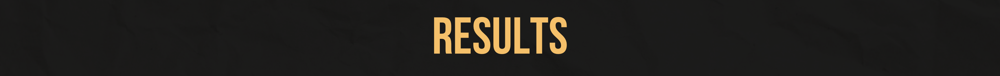

The three songs listed below were subjected to the model, and were inputted by the volunteer testers:
* Yellow by Coldplay
* Dreams by Fleetwood Mac
* Lifetime by Ben&Ben

Below is a table containing the outputs of the algorithm, and the outputs of the first and second volunteers.

| Algorithm            | Volunteer 1       | Volunteer 2       |
|----------------------|-------------------|-------------------|
| Clocks by Coldplay   | Electric Touch by Taylor Swift | My Shot by Lin-Manuel Miranda |
| Are You Bored Yet? (Feat. Claire) by Wallows | Snow on the Beach by Taylor Swift | The Story of Tonight by Lin-Manuel Miranda |
| As it Was by Harry Styles | Mina(mahal ko) by rhodessa | Alexander Hamilton by Leslie Odom Jr. |
| Magic by Coldplay    | Kisame by rhodessa | Only by LeeHi |
| Electric Love by BØRNS | Euphoria by Smyang Piano | Sincerity is Scary by The 1975 |
| Sweater Weather by The Neighborhood | Mrs. Hollywood by Go-Jo | Aaron Burr, Sir by Lin-Manuel Miranda |
| Sparks by Coldplay   | Future - Red Velvet | Wait for It by Leslie Odom Jr. |
| The Scientist by Coldplay | golden hour - SB19 Remix by JVKE | Helpless by Philippa Soo |
| Late Night Talking by Harry Styles | Grown Ups by Sondia | Farmer Refuted by Thayne Jasperson |
| Kiss Me by Sixpence None The Richer | Drifting by Tiesto | Right Hand Man by Lin-Manuel Miranda |
<center><strong><em>Table 4.</em></strong> Results from Algorithm and from Volunteers’ Spotify Recommendations</center>

#### *Assessment of Results: Quantitative Metrics*
As previously discussed in the Methodology section, we use L1 Distance, L2 Distance, Cosine Distance, and Mahalanobis Distance as the quantitative validation of the results outputted by the algorithm, and the volunteers’ Spotify. Below are the results:

| Metric                          | Algorithm | Volunteer 1 | Volunteer 2 |
|---------------------------------|-----------|-------------|-------------|
| Manhattan Distance (L1 Distance) | 1.44      | 1.84        | 183.07      |
| Euclidean Distance (L2 Distance) | 3.34      | 4.15        | 179.93      |
| Cosine Distances                | 4.13      | 4.65        | 0.73        |
| Mahalanobis Distance            | 0.38      | 0.42        | 4.33        |
<center><strong><em>Table 5.</em></strong> Distance Calculations from Recommendations of Algorithm and Volunteers’</center>

When comparing the algorithm's recommendations to those of the first volunteer, the algorithm registered lower values in L1, L2, and Cosine Distances. This indicates that the algorithm's recommendations were more similar to the input songs in terms of their audio features than the first volunteer's recommendations. Furthermore, the Mahalanobis Distance values for the algorithm and the first volunteer suggest that the algorithm's recommendations (0.38) bear a closer resemblance to the input songs than those from the first volunteer (0.42).

Upon executing the same comparison with the second volunteer, the algorithm again scored lower in L1, L2, and Cosine Distances, suggesting that its recommendations were more similar to the input songs in terms of their audio features compared to the second volunteer's recommendations. Notably, the L1 and L2 values for the second volunteer are significantly high, indicating a substantial difference between Spotify's recommended songs and the input songs. Similarly, the Mahalanobis Distance indicates that the algorithm’s recommendations are more similar to the input songs than those from the second volunteer.

This comparison has demonstrated that the algorithm excels at recommending songs similar to the input selections. This is evident by its consistently lower Manhattan, Euclidean, and Cosine Distance scores compared to the volunteers’ Spotify recommendations.

#### *Assessment of Results: Qualitative Metrics*

While quantitative metrics determine model robustness, it does not address the expected satisfaction of stakeholders. The two volunteers were asked the following questions:

1. **Relevance:** Which songs do you think are relevant?
2. **Novel:** Which songs are you unfamiliar with but you may find particularly interesting?

The first volunteer stated that nine (9) out of 10 songs recommended by the algorithm were relevant, and only eight (8) out of 10 songs recommended by Spotify were relevant. The second volunteer stated that nine (9) out of 10 songs recommended by the algorithm were relevant, and only one (1) out of 10 songs recommended by Spotify was relevant.

In terms of novelty, the first volunteer was unfamiliar with four (4) songs from the algorithm's recommendations, while finding only one (1) unfamiliar song from Spotify's recommendations. Similarly, the second volunteer found just one unfamiliar song in each set of recommendations, from the algorithm and Spotify.

The volunteers discovered more unfamiliar songs from the algorithm's recommendations compared to Spotify's, all while making sure that the recommendations are consistent with the audio features of the input songs. This indicates the model's ability to go beyond simply mimicking existing playlists and introduce users to new music that are both relevant and novel.

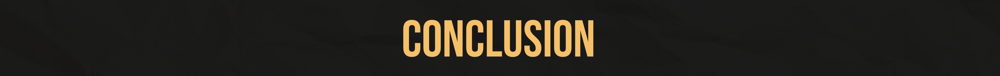
This study has developed and tested a business-oriented music curation algorithm, leveraging context-based filtering and Frequent Itemset Mining (FIM) to generate recommendations for playlist creation tailored to specific business ambiances. Compared to the user-centric recommendation system that Spotify has employed for its playlist curation system, this algorithm prioritizes business goals by considering the type of establishment and the desired customer experience.

The implemented algorithm demonstrated its effectiveness in generating relevant song suggestions that align with the audio features of user-provided inputs, while also introducing users to new and potentially interesting music selections. These findings highlight the algorithm's potential to empower businesses to curate playlists that enhance brand image, cultivate desired customer experiences, and potentially influence customer behavior.

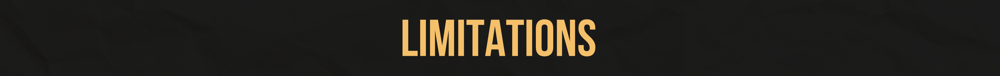
##### *Volunteer and Results Limitations*
It must be noted that only two individuals volunteered for the experiment. The qualitative data might not be generalizable to a larger population. Including more testers would strengthen the findings. Furthermore, relevance and novelty are subjective experiences. What one user finds interesting, another might not. Expanding the qualitative metrics to include aspects like enjoyment or surprise could provide a more nuanced picture.

##### *Spotify API Token*
Furthermore, the study's reliance on the Spotify Web API introduces limitations in data acquisition. The API's restrictions on retrievable data volume per token can hinder the comprehensiveness of the dataset. This, in turn, can affect the generalizability of the findings to a broader range of business types.

For instance, a more extensive dataset, facilitated by a larger pool of Spotify tokens, would allow exploration of music curation for various business environments beyond cafes. This could include hotel lobbies, restaurants with distinct ambiences, and bookstores seeking to cultivate a specific atmosphere. By incorporating a wider variety of business types, the study could provide more nuanced insights into the application of the algorithm across different industries.

##### *Keyword Limitation*
For this study, the researchers had to manually input keywords 'cafe,' 'coffee,' 'shop,' 'kape,' and 'pinoy' to obtain the dataset used for context-based filtering and FIM. Therefore, another limitation of the current approach is its dependence on predefined keywords for business type identification. The algorithm relies on manual input of specific keywords that accurately reflect their desired ambiance. Ideally, the system would possess the capability to automatically recognize and associate relevant keywords with various business categories.

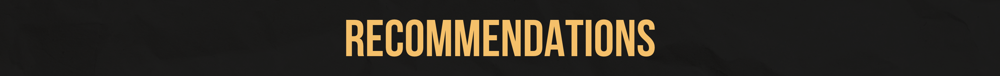
With the assumption of abundant Spotify API tokens and access to a comprehensive keyword library, the researchers may further explore diverse business types. The limitations imposed by data volume could be overcome, allowing researchers to delve into music curation for a wider array of business environments. This could encompass hotel lobbies with specific vibes (e.g., luxurious, modern, family-oriented), restaurants catering to various cuisines and ambiences (e.g., fine dining, casual dining, fast food), and bookstores seeking unique atmospheres (e.g., classic, modern, genre-specific). By incorporating a richer tapestry of business types and their associated keywords, the algorithm could refine its ability to generate highly relevant and contextually appropriate music suggestions.

Another opportunity to be delved into would be developing or integrating with a comprehensive keyword library that maps business types to relevant keywords and sub-keywords (e.g., ambience variations) would streamline data collection and enhance the accuracy of business type identification.

By building upon the success and foundations laid upon by this study, future researchers have the power to transform this algorithm into a powerful tool for businesses seeking to leverage music. This will provide them an opportunity to cultivate their desired atmosphere and customer experience with ease, may it be in Spotify or other similar platforms.

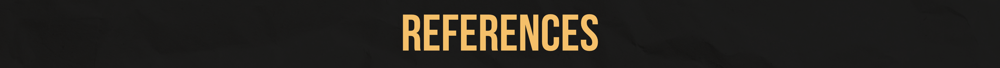
- Agrawal, R., & Srikant, R. (1994). Fast algorithms for mining association rules. In *Proceedings of the 20th International Conference on Very Large Data Bases* (VLDB), 487-499.
- Danielsson, P.-E. (1980). Euclidean Distance Mapping. *Computer Graphics and Image Processing*, 14(3), 227-248.
- Deza, E., & Deza, M. M. (2009). *Encyclopedia of Distances*. Springer.
- Han, J., Pei, J., & Yin, Y. (2000). Mining frequent patterns without candidate generation. In *Proceedings of the ACM SIGMOD International Conference on Management of Data*, 1-12.
- Mahalanobis, P. C. (1936). On the generalized distance in statistics. *Proceedings of the National Institute of Sciences of India*, 2(1), 49-55.
- Plamere, P. (2023). Spotipy: A lightweight Python library for the Spotify Web API (Version 2.22.1). Retrieved March 9, 2024, from https://spotipy.readthedocs.io/en/2.22.1/
- Singh, S., & Singh, M. (2010). Cosine Similarity and Cosine Distance in Data Mining: An Overview. *International Journal of Advanced Research in Computer Science*, 1(3), 176-183.
- Zaki, M. J. (2000). Scalable algorithms for association mining. *IEEE Transactions on Knowledge and Data Engineering*, 12(3), 372-390.